C:\Users\avisa\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\avisa\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\avisa\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\avisa\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

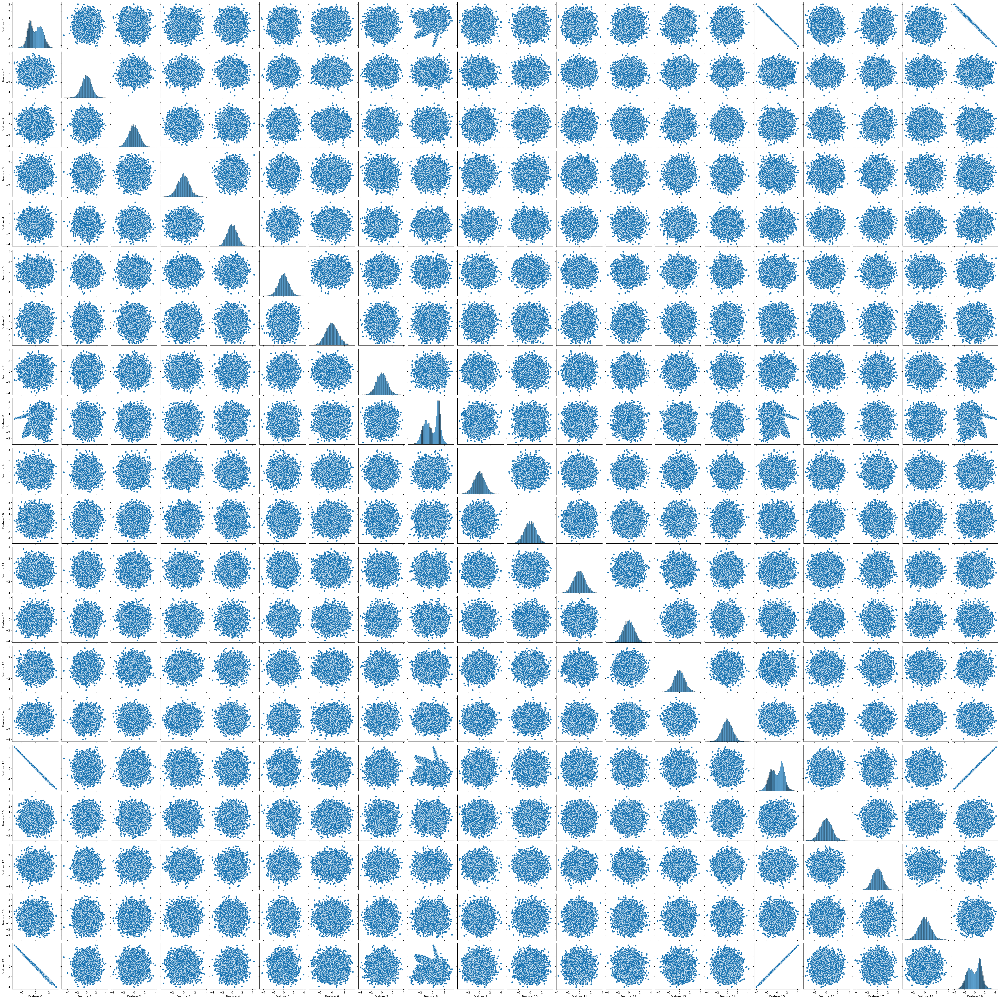

C:\Users\avisa\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


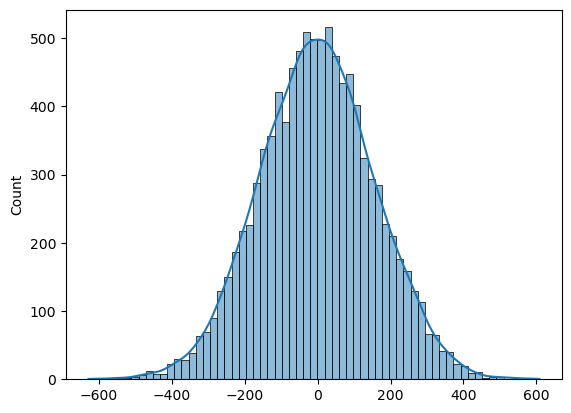

In [7]:
import numpy as np
import pandas as pd
from sklearn.datasets import make_classification, make_regression
import matplotlib.pyplot as plt
import seaborn as sns

# Generate synthetic classification data
X_classification, y_classification = make_classification(n_samples=10000, n_features=20, n_classes=2)

# Convert X_classification to pandas DataFrame
X_classification_df = pd.DataFrame(X_classification, columns=[f'Feature_{i}' for i in range(X_classification.shape[1])])

# Visualize synthetic classification data
sns.pairplot(data=X_classification_df)
plt.show()

# Generate synthetic regression data
X_regression, y_regression = make_regression(n_samples=10000, n_features=20)

# Visualize synthetic regression data
sns.histplot(data=y_regression, kde=True)
plt.show()


Epoch 1/10
250/250 [==============================] - 4s 7ms/step - loss: 16880.9863 - mae: 98.0420 - val_loss: 2082.9424 - val_mae: 30.0296
Epoch 2/10
250/250 [==============================] - 1s 4ms/step - loss: 438.6724 - mae: 13.3399 - val_loss: 124.0258 - val_mae: 8.4166
Epoch 3/10
250/250 [==============================] - 1s 4ms/step - loss: 105.0803 - mae: 7.7985 - val_loss: 94.2979 - val_mae: 7.5958
Epoch 4/10
250/250 [==============================] - 1s 4ms/step - loss: 86.6703 - mae: 7.1326 - val_loss: 78.9791 - val_mae: 7.0057
Epoch 5/10
250/250 [==============================] - 1s 4ms/step - loss: 72.0762 - mae: 6.4990 - val_loss: 65.7863 - val_mae: 6.3077
Epoch 6/10
250/250 [==============================] - 1s 4ms/step - loss: 58.9915 - mae: 5.8892 - val_loss: 54.2036 - val_mae: 5.8726
Epoch 7/10
250/250 [==============================] - 1s 4ms/step - loss: 47.8214 - mae: 5.3066 - val_loss: 43.3076 - val_mae: 5.2172
Epoch 8/10
250/250 [==============================]

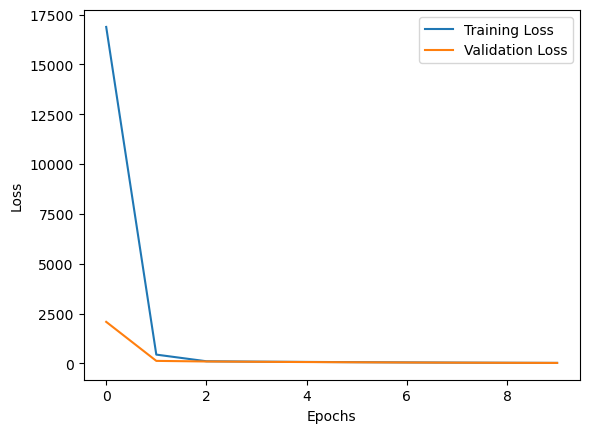

In [8]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

# Build a feedforward neural network model
model = Sequential([
    Dense(64, activation='relu', input_shape=(20,)),
    Dense(64, activation='relu'),
    Dense(1)
])

model.compile(optimizer='adam',
              loss='mse',
              metrics=['mae'])

# Train the model
history = model.fit(X_regression, y_regression, epochs=10, validation_split=0.2)

# Plot training history
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


313/313 [==============================] - 1s 3ms/step


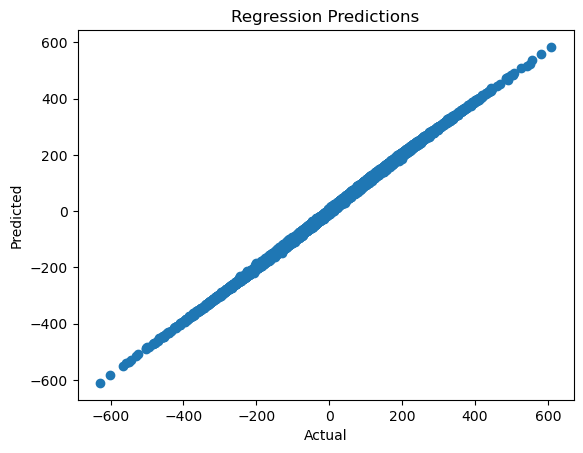

In [9]:
# Model Evaluation
y_pred = model.predict(X_regression)

# Visualize regression predictions
plt.scatter(y_regression, y_pred)
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Regression Predictions')
plt.show()


1/1 [==============================] - 0s 190ms/step


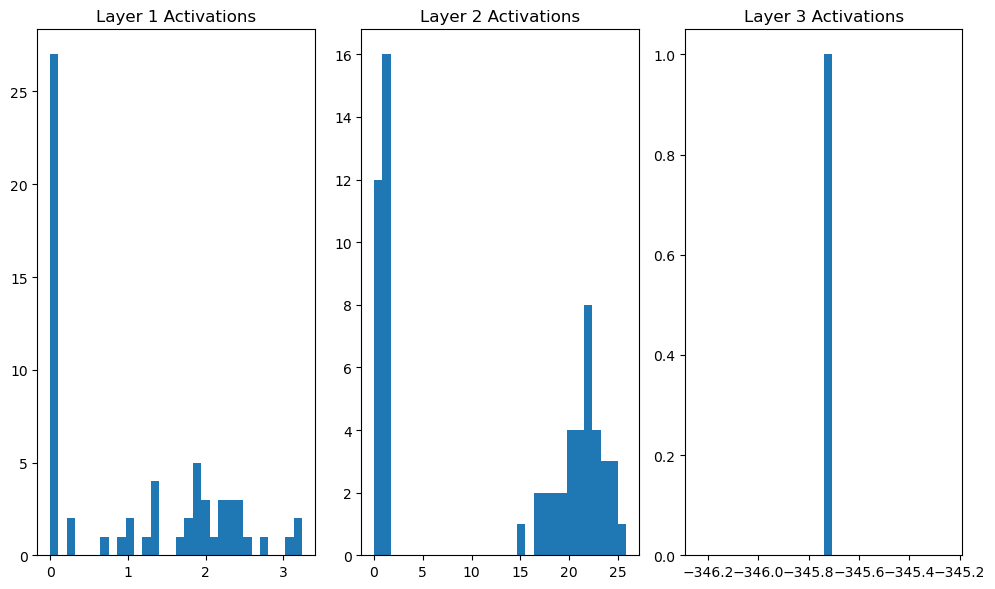

In [10]:
from tensorflow.keras.models import Model

# Create a model to access intermediate layer outputs
layer_outputs = [layer.output for layer in model.layers]
activation_model = Model(inputs=model.input, outputs=layer_outputs)

# Choose a sample from the dataset
sample_index = 0
activations = activation_model.predict(X_regression[sample_index].reshape(1, -1))

# Visualize activations for each neuron in the first layer
plt.figure(figsize=(10, 6))
for i in range(len(activations)):
    plt.subplot(1, len(activations), i+1)
    plt.hist(activations[i].flatten(), bins=30)
    plt.title('Layer {} Activations'.format(i+1))
plt.tight_layout()
plt.show()


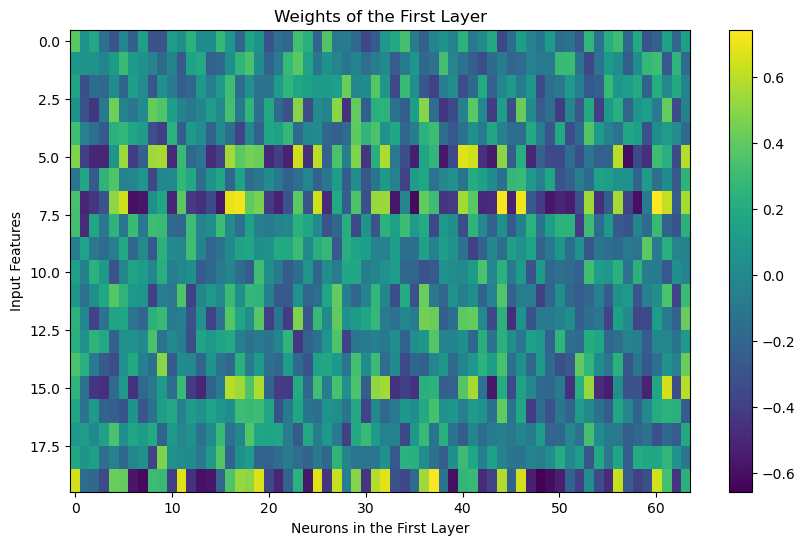

In [11]:
# Get weights of the first layer
weights = model.layers[0].get_weights()[0]

# Visualize weights of the first layer
plt.figure(figsize=(10, 6))
plt.imshow(weights, cmap='viridis', aspect='auto')
plt.colorbar()
plt.title('Weights of the First Layer')
plt.xlabel('Neurons in the First Layer')
plt.ylabel('Input Features')
plt.show()


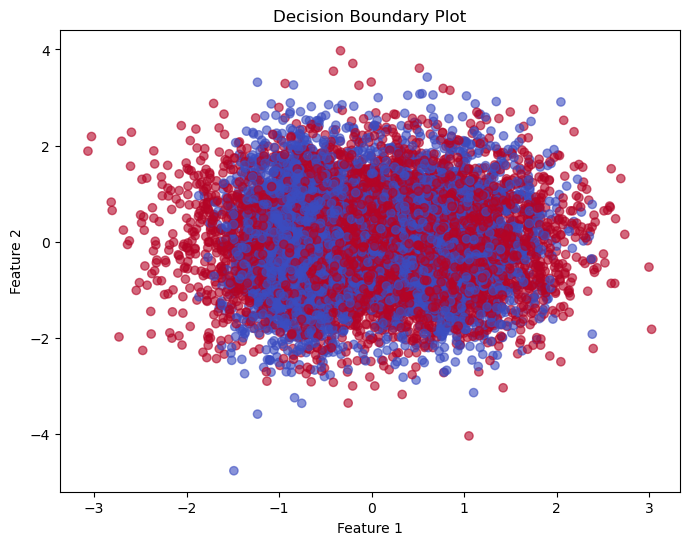

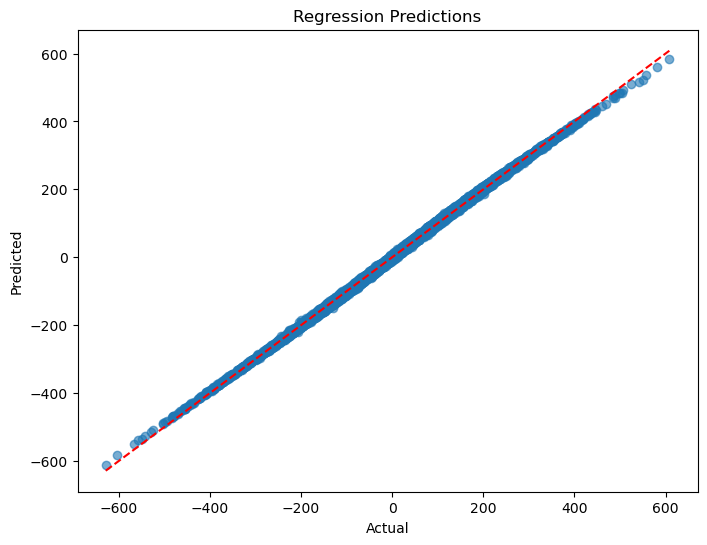

In [12]:
# Decision boundary plot for classification tasks
# Assuming binary classification for simplicity
plt.figure(figsize=(8, 6))
plt.scatter(X_classification[:, 0], X_classification[:, 1], c=y_classification, cmap='coolwarm', alpha=0.6)
plt.title('Decision Boundary Plot')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.show()

# Scatter plot for regression tasks
plt.figure(figsize=(8, 6))
plt.scatter(y_regression, y_pred, alpha=0.6)
plt.plot([min(y_regression), max(y_regression)], [min(y_regression), max(y_regression)], color='red', linestyle='--')
plt.title('Regression Predictions')
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.show()


Epoch 1/10
250/250 [==============================] - 4s 6ms/step - loss: 16717.6602 - mae: 97.3351 - val_loss: 1407.4391 - val_mae: 26.2288
Epoch 2/10
250/250 [==============================] - 1s 4ms/step - loss: 311.3584 - mae: 11.9874 - val_loss: 114.8996 - val_mae: 8.2823
Epoch 3/10
250/250 [==============================] - 1s 4ms/step - loss: 101.8257 - mae: 7.7104 - val_loss: 91.0112 - val_mae: 7.3994
Epoch 4/10
250/250 [==============================] - 1s 5ms/step - loss: 84.1441 - mae: 7.0310 - val_loss: 74.4639 - val_mae: 6.6452
Epoch 5/10
250/250 [==============================] - 1s 5ms/step - loss: 69.7280 - mae: 6.4214 - val_loss: 63.9667 - val_mae: 6.1384
Epoch 6/10
250/250 [==============================] - 1s 4ms/step - loss: 56.6105 - mae: 5.7625 - val_loss: 50.7524 - val_mae: 5.5444
Epoch 7/10
250/250 [==============================] - 1s 4ms/step - loss: 45.4227 - mae: 5.1724 - val_loss: 41.1764 - val_mae: 4.9335
Epoch 8/10
250/250 [==============================]

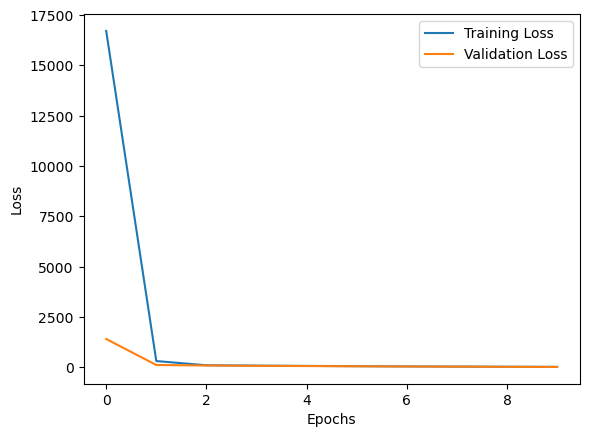

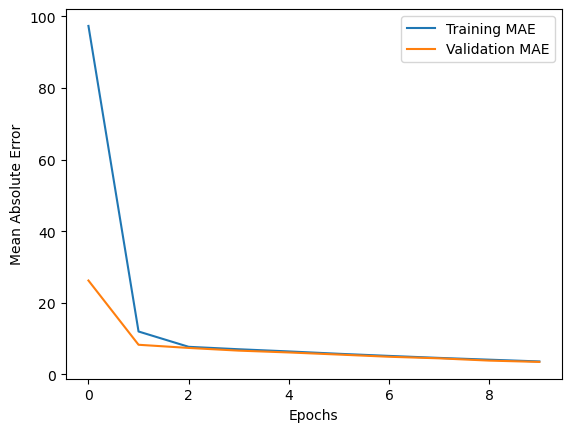

In [13]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

# Build a feedforward neural network model
model = Sequential([
    Dense(64, activation='relu', input_shape=(20,)),
    Dense(64, activation='relu'),
    Dense(1)
])

model.compile(optimizer='adam',
              loss='mse',
              metrics=['mae'])

# Train the model
history = model.fit(X_regression, y_regression, epochs=10, validation_split=0.2)

# Plot training history
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Plot training and validation mean absolute error
plt.plot(history.history['mae'], label='Training MAE')
plt.plot(history.history['val_mae'], label='Validation MAE')
plt.xlabel('Epochs')
plt.ylabel('Mean Absolute Error')
plt.legend()
plt.show()


313/313 [==============================] - 1s 3ms/step


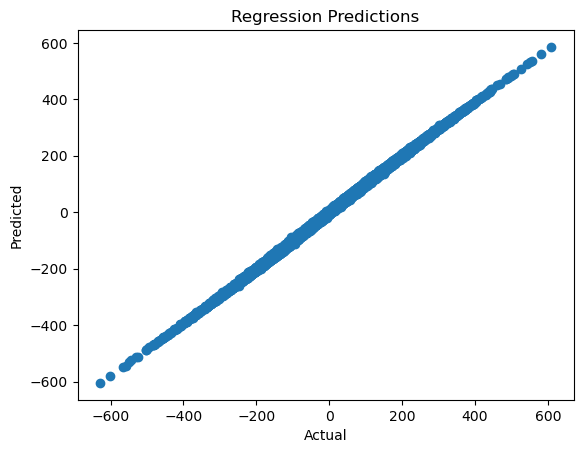

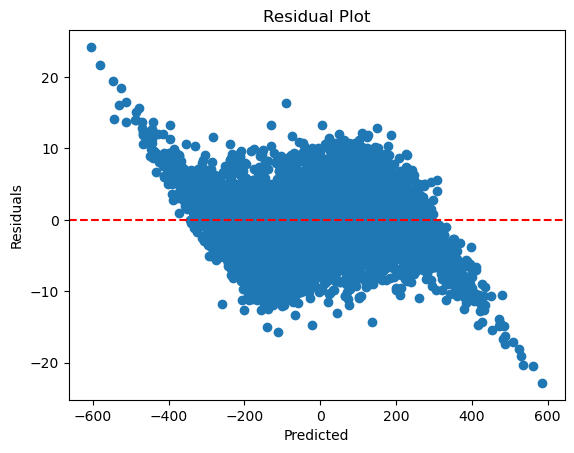

In [15]:
# Model Evaluation
y_pred = model.predict(X_regression)

# Visualize regression predictions
plt.scatter(y_regression, y_pred)
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Regression Predictions')
plt.show()

# Reshape y_pred to match the shape of residuals
y_pred = y_pred.flatten()

# Visualize the residuals
residuals = y_pred - y_regression
plt.scatter(y_pred, residuals)
plt.xlabel('Predicted')
plt.ylabel('Residuals')
plt.title('Residual Plot')
plt.axhline(y=0, color='r', linestyle='--')
plt.show()
